In [1]:
%config Completer.use_jedi = False

In [2]:
from astropy.wcs import WCS
import healpy as hp
from pyuvdata import UVData, UVBeam, UVFlag
from astropy.io import fits
from astropy.wcs import WCS
import matplotlib.pyplot as plt
import numpy as np
import glob as glob

In [3]:
import casatasks
from casatasks import importuvfits, exportfits, tclean,importfits

In [4]:
import matplotlib.image as mpimg

In [5]:
import polcal

In [6]:
from scipy.interpolate import interp1d

In [7]:
import time

In [8]:
import imager

In [9]:
import glob, copy

In [10]:
import uvtools

In [11]:
import matplotlib as mpl

# Introduction

In this notebook, we aim to summarize our progress in applying Smirnov-Tasse calibration algorithm (Smirnov&Tasse 2015) on HERA-19 data. 
<br> 
We pick ~10 minutes of  HERA-19 data from LST range 18h18m00s-18h29m50s on JD 2457548. We use pyuvsim (https://github.com/RadioAstronomySoftwareGroup/pyuvsim) to generate model data from GSM (https://github.com/telegraphic/pygdsm) with the HERA beam model from https://github.com/HERA-Team/HERA-Beams/blob/master/NicolasFagnoniBeams/NF_HERA_Dipole_efield_beam.fits. Then we run POLCAL to retain the per-frequency gains on 100 channels sampled from HERA band. We interpolate the gains of the whole HERA band and apply them back to the raw data. Finally we have the "ST calibrated" HERA-19 data. 

## data check

We find the uvw_array in the simualted data is in the opppsite direction of the raw data, while we check this difference doesn't lead to a necessity to conjugate the data. 
<br>
Below we show the position of gc in the image from the conjugated raw data mismatches the position of gc from the model. 

Set OBSGEO-B to   -30.721389 from OBSGEO-[XYZ].
Set OBSGEO-H to     1496.994 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


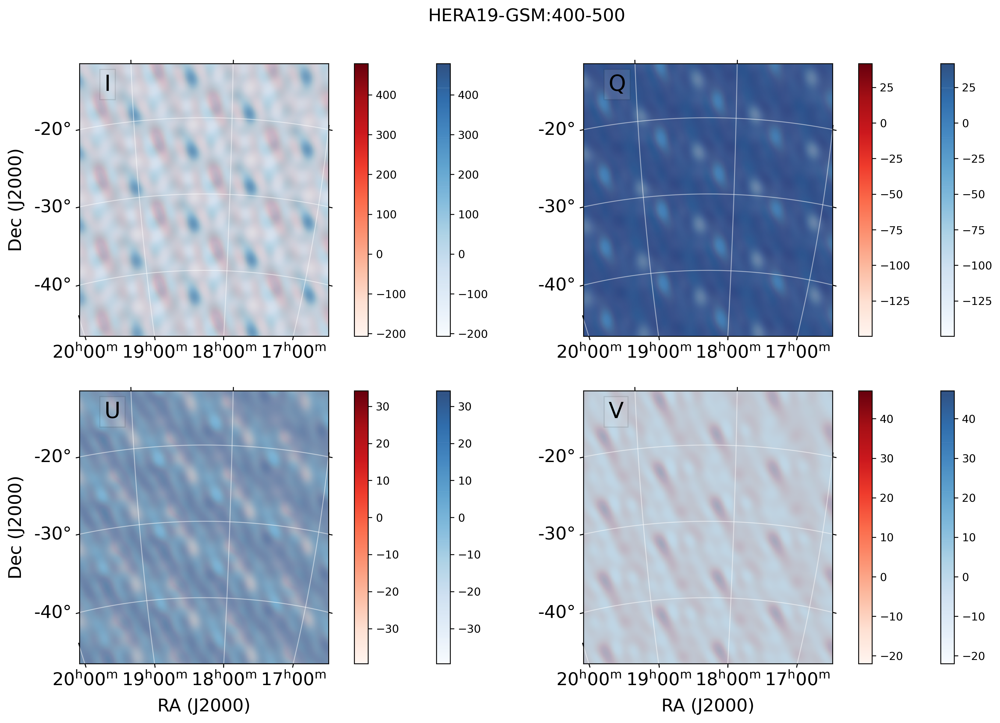

In [74]:
overlay_dirty_images('/lustre/aoc/projects/hera/jtan/HERA19/images/lst.2457548.18h18m00s.18h29m50s.400_500.uvcRP.phased.conj.fits',\
                     '/lustre/aoc/projects/hera/jtan/uvsim/gsm_nside128/images/lst.2457548.18h18m00s.18h29m50s.400_500.reverted.dipole.fits',\
                     'HERA19-GSM:400-500')

And we find the original beam model at  https://github.com/HERA-Team/HERA-Beams/blob/master/NicolasFagnoniBeams/NF_HERA_Dipole_efield_beam.fits results in large off-diagonal D-terms in the gain matrices. Therefore we propose to revert the dipole of the original beam model.
<br>
Below we show the gain matrices with the original beam and the reverted beam

Text(0.5, 1.0, 'with reverted dipole')

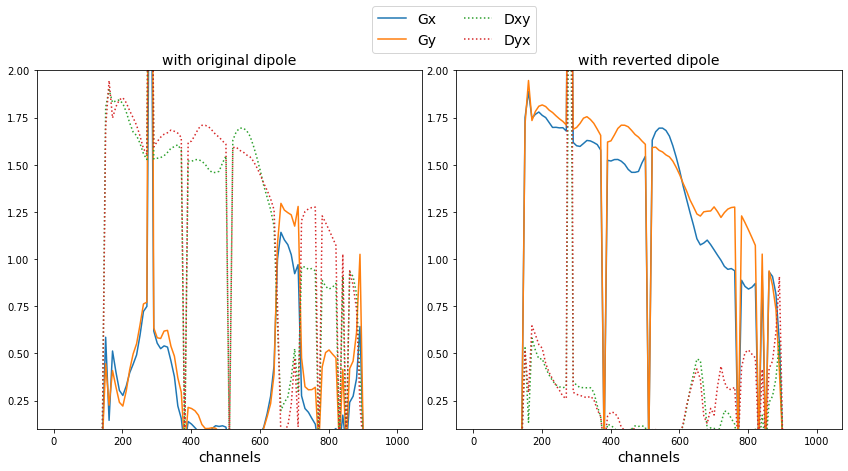

In [19]:
fig, axes = plt.subplots(figsize=(12,6), ncols=2, nrows=1)
ant = 2
ax = axes[0]
ax.plot(freqs, np.abs(gains_raw_on_sim[:,-1,ant,0,0]), label="Gx")
ax.plot(freqs, np.abs(gains_raw_on_sim[:,-1,ant,1,1]), label="Gy")
ax.plot(freqs, np.abs(gains_raw_on_sim[:,-1,ant,0,1]), ls=":", label="Dxy")
ax.plot(freqs, np.abs(gains_raw_on_sim[:,-1,ant,1,0]), ls=":", label="Dyx")
ax.set_ylim(1e-1,2)
ax.set_xlabel("channels", fontsize=14)
ax.set_title("with original dipole", fontsize=14)

handles, labels = ax.get_legend_handles_labels()
fig.legend(handles, labels, bbox_to_anchor=(0.53,1.10), loc='upper center', fontsize=14, ncol=2,)
fig.tight_layout()

ax = axes[1]
ax.plot(freqs, np.abs(gains_raw_on_sim_r[:,-1,ant,0,0]))
ax.plot(freqs, np.abs(gains_raw_on_sim_r[:,-1,ant,1,1]))
ax.plot(freqs, np.abs(gains_raw_on_sim_r[:,-1,ant,0,1]), ls=":")
ax.plot(freqs, np.abs(gains_raw_on_sim_r[:,-1,ant,1,0]), ls=":")
ax.set_ylim(1e-1,2)
ax.set_xlabel("channels", fontsize=14)
ax.set_title("with reverted dipole", fontsize=14)


## shape of gains

We interpolate the gains of the whole HERA band from calibration of unconjugated raw data on model data from reverted dipole beam. 

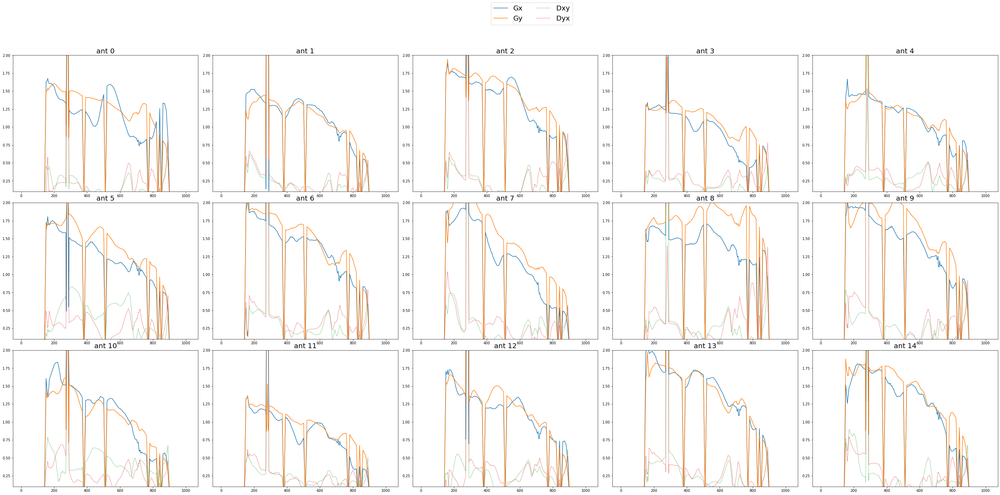

In [73]:
fig, axes = plt.subplots(figsize=(40,18), ncols=5, nrows=3)
for ant_index in range(15):
    row_index = np.int(ant_index / 5)
    col_index = ant_index  - 5*row_index
    ax = axes[row_index,col_index]
    ax.plot(np.abs(interpolated_gains[ant_index,:,0,0]), label="Gx")
    ax.plot(np.abs(interpolated_gains[ant_index,:,1,1]), label="Gy")
    ax.plot(np.abs(interpolated_gains[ant_index,:,0,1]), ls=":", label="Dxy")
    ax.plot(np.abs(interpolated_gains[ant_index,:,1,0]), ls=":", label="Dyx")
    ax.set_ylim(1e-1,2)
    ax.set_title("ant {}".format(ant_index), fontsize=20)
    if ant_index == 0:
        handles, labels = ax.get_legend_handles_labels()
        fig.legend(handles, labels, bbox_to_anchor=(0.53,1.10), loc='upper center', fontsize=20, ncol=2,)
        fig.tight_layout()

#### with flags

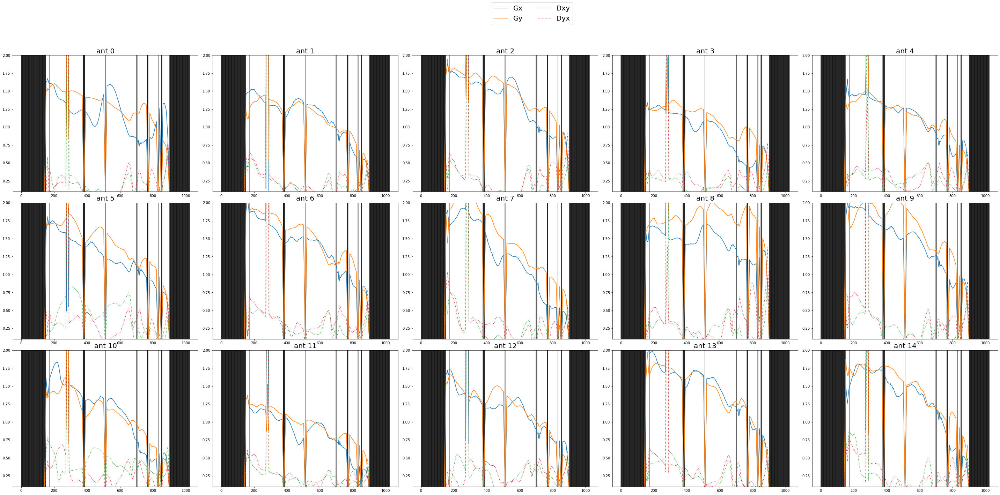

In [72]:
fig, axes = plt.subplots(figsize=(40,18), ncols=5, nrows=3)
for ant_index in range(15):
    row_index = np.int(ant_index / 5)
    col_index = ant_index  - 5*row_index
    ax = axes[row_index,col_index]
    for _x in np.argwhere(flag_array>0):
        ax.axvline(x=_x, c='k', alpha=0.5)
    ax.plot(np.abs(interpolated_gains[ant_index,:,0,0]), label="Gx")
    ax.plot(np.abs(interpolated_gains[ant_index,:,1,1]), label="Gy")
    ax.plot(np.abs(interpolated_gains[ant_index,:,0,1]), ls=":", label="Dxy")
    ax.plot(np.abs(interpolated_gains[ant_index,:,1,0]), ls=":", label="Dyx")
    ax.set_ylim(1e-1,2)
    ax.set_title("ant {}".format(ant_index), fontsize=20)
    if ant_index == 0:
        handles, labels = ax.get_legend_handles_labels()
        fig.legend(handles, labels, bbox_to_anchor=(0.53,1.10), loc='upper center', fontsize=20, ncol=2,)
        fig.tight_layout()

## comparison of images

We make undeconvolved images from channels 100-900. 

Set OBSGEO-B to   -30.721389 from OBSGEO-[XYZ].
Set OBSGEO-H to     1496.994 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


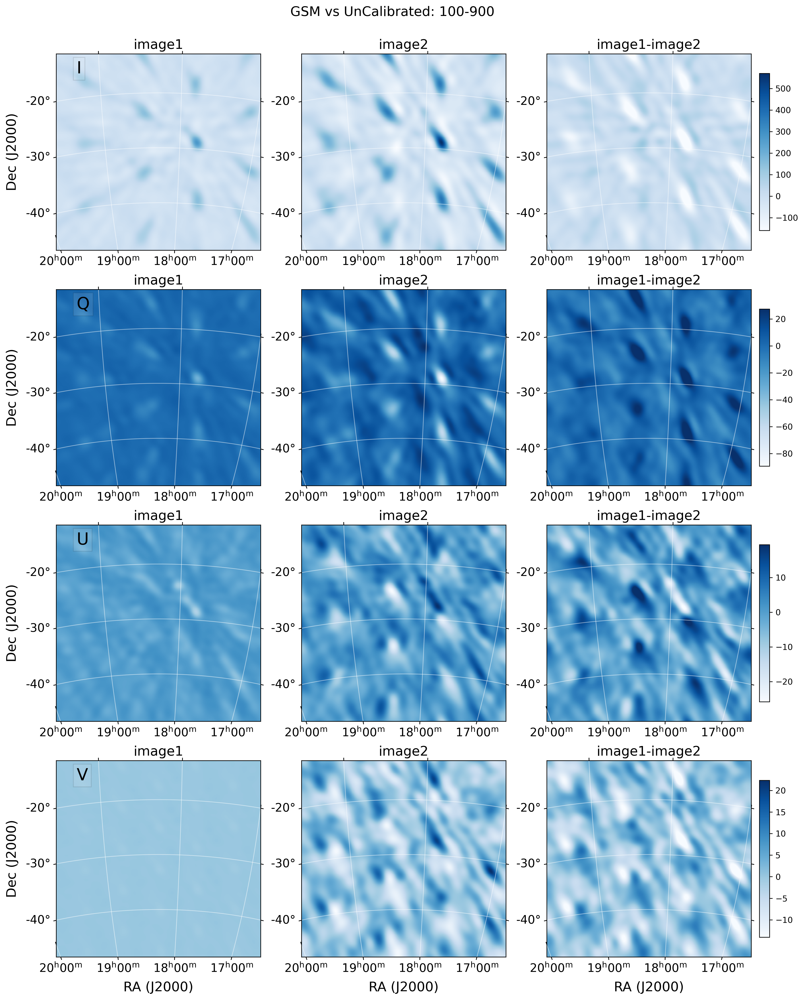

In [62]:
plot_image_difference("/lustre/aoc/projects/hera/jtan/uvsim/gsm_nside128/images/lst.2457548.18h18m00s.18h29m50s.100_900.reverted.dipole.fits", \
                     "/lustre/aoc/projects/hera/jtan/HERA19/images/lst.2457548.18h18m00s.18h29m50s.100_900.uvcRP.phased.fits", \
                     reference="2", title="GSM vs UnCalibrated: 100-900")

Set OBSGEO-B to   -30.721389 from OBSGEO-[XYZ].
Set OBSGEO-H to     1496.994 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


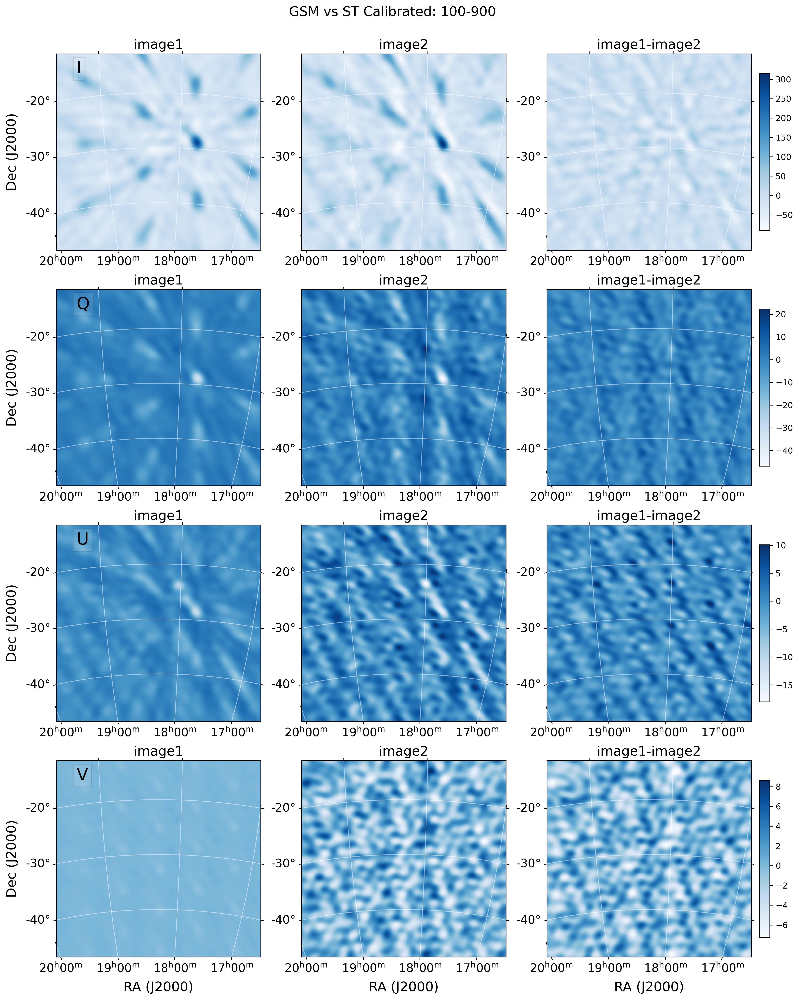

In [61]:
plot_image_difference("/lustre/aoc/projects/hera/jtan/uvsim/gsm_nside128/images/lst.2457548.18h18m00s.18h29m50s.100_900.reverted.dipole.fits", \
                     "/lustre/aoc/projects/hera/jtan/HERA19calibrated/images/lst.2457548.18h18m00s.18h29m50s.100_900.uvcRP.phased.calibration_on_reverted_dipole.fits", \
                     reference="2", title="GSM vs ST Calibrated: 100-900")